# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

5) [5 баллов] Доп. задача 2: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

In [2]:
!git add cv_hw3.ipynb
!git commit -m "Added the third homework"
!git push origin main

fatal: спецификатор пути «cb_hw3.ipynb» не соответствует ни одному файлу
Текущая ветка: main
Эта ветка соответствует «origin/main».

Изменения, которые не в индексе для коммита:
  (используйте «git add <файл>...», чтобы добавить файл в индекс)
  (используйте «git restore <файл>...», чтобы отменить изменения в рабочем каталоге)
	изменено:      cv_hw1.ipynb
	изменено:      cv_hw3.ipynb
	изменено:      github_hw1.ipynb
	изменено:      github_sem1.ipynb

Неотслеживаемые файлы:
  (используйте «git add <файл>...», чтобы добавить в то, что будет включено в коммит)
	../data/imgs/3.mov

индекс пуст (используйте «git add» и/или «git commit -a»)
Everything up-to-date


In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import glob

In [142]:
plt.rcParams["figure.figsize"] = (10, 10)

images = glob.glob('../data/imgs/arrow/*.png')

In [143]:
def get_mask(img):
    frame_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

    low_th =  (cv.getTrackbarPos('rl', 'frame'),
               cv.getTrackbarPos('gl', 'frame'),
               cv.getTrackbarPos('bl', 'frame'))
        
    high_th = (cv.getTrackbarPos('rh', 'frame'),
               cv.getTrackbarPos('gh', 'frame'),
               cv.getTrackbarPos('bh', 'frame'))
    
    mask = cv.inRange(frame_hsv, low_th, high_th)
    #cv.imshow("frame", mask)

    return mask

def nothing(val):
    pass

def find_contour (img, low_th, high_th):    
    frame_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

    mask = cv.inRange(frame_hsv, low_th, high_th)
    
    contours, hierarchy = cv.findContours(mask, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    cnt = max(contours, key=lambda x: cv.contourArea(x))

    approx = cv.convexHull(cnt)

    epsilon = 0.05 * cv.arcLength(approx, True)
    approx = cv.approxPolyDP(approx, epsilon, True)

    return approx

def find_distance (img, low_th, high_th):
    contour = find_contour(img, low_th, high_th)
    
    length = cv.arcLength(contour, True)
    
    contour_marked = cv.drawContours(img, contour, -1, (0, 255, 0), 33)

    distance = 180.0 * 364 / length

    plt.imshow(contour_marked)
    plt.axis('off')
    plt.show()
    
    return distance

In [144]:
lth, hth = (0, 0, 193), (64, 65, 255)

cv.namedWindow("frame")

cv.createTrackbar("rl", "frame",  lth[0], 255, nothing)
cv.createTrackbar("gl", "frame",  lth[1], 255, nothing)
cv.createTrackbar("bl", "frame",  lth[2], 255, nothing)
cv.createTrackbar("rh", "frame",  hth[0], 255, nothing)
cv.createTrackbar("gh", "frame",  hth[1], 255, nothing)
cv.createTrackbar("bh", "frame",  hth[2], 255, nothing)
#cv.createTrackbar("ksz", "frame", 0, 20, nothing)

img = cv.imread('../data/imgs/arrow/vlcsnap-2020-10-21-18h01m51s638.png')

while(True):
    frame = np.copy(img)

    mask = get_mask(frame)
    mask_3ch = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)

    res = np.concatenate((frame, mask_3ch), axis=1)

    cv.imshow('frame', res)

    key = cv.waitKey(240) & 0xFF

    if(key == ord('q')):
        break

cv.destroyAllWindows()
cv.waitKey(10)

-1

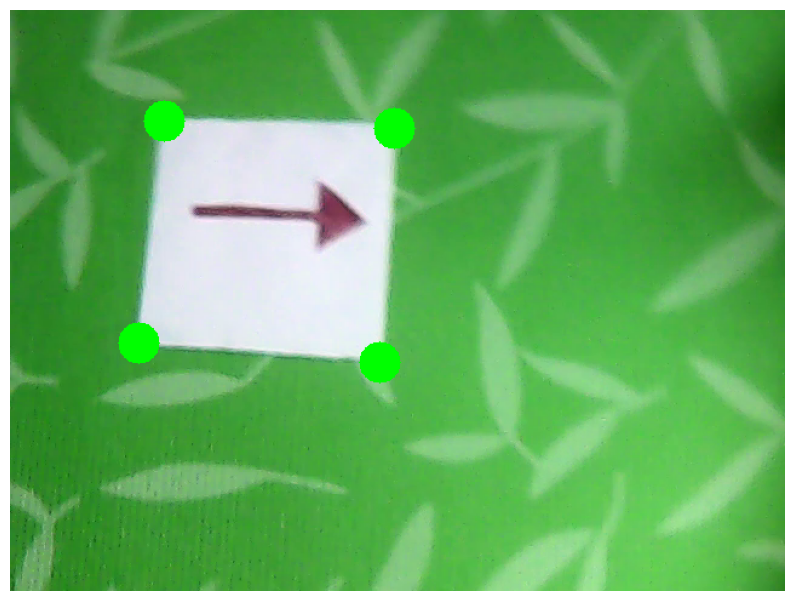

dist =  85.38915431816494


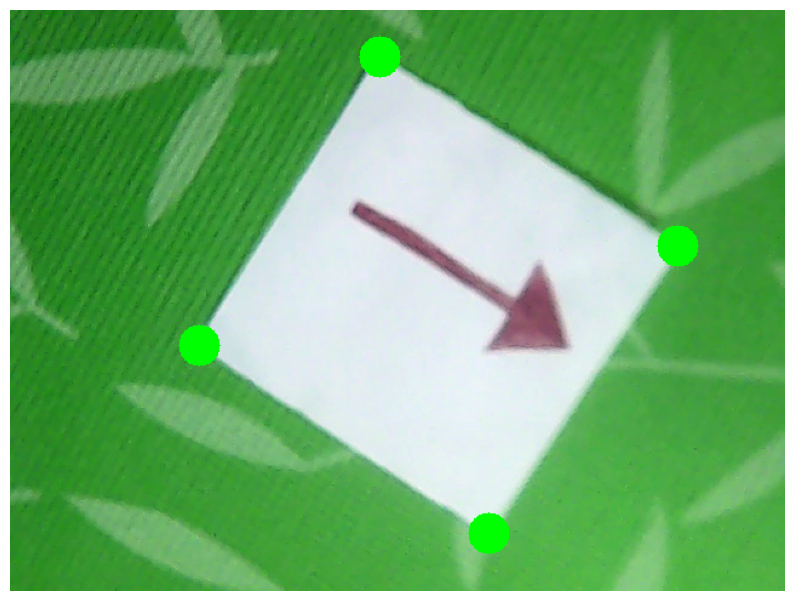

dist =  57.43929184654017


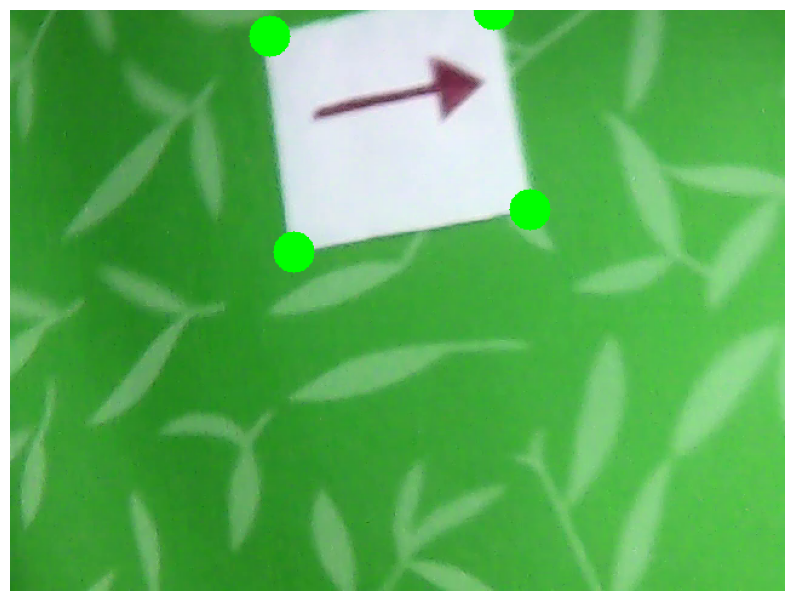

dist =  89.60063568827069


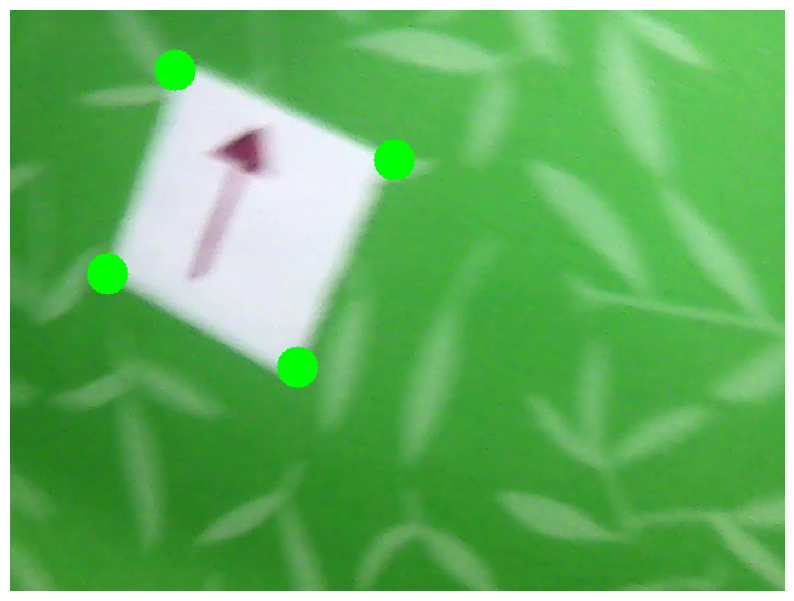

dist =  88.98736697416521


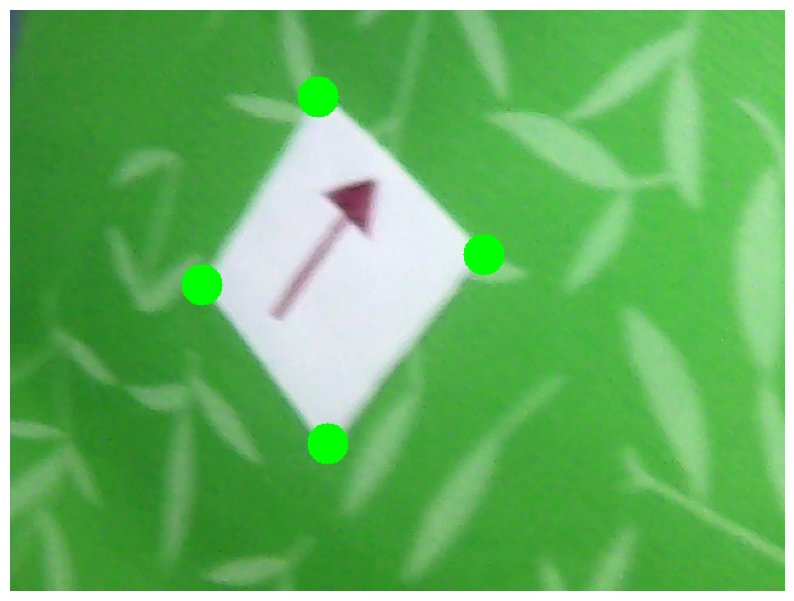

dist =  88.43602380073878


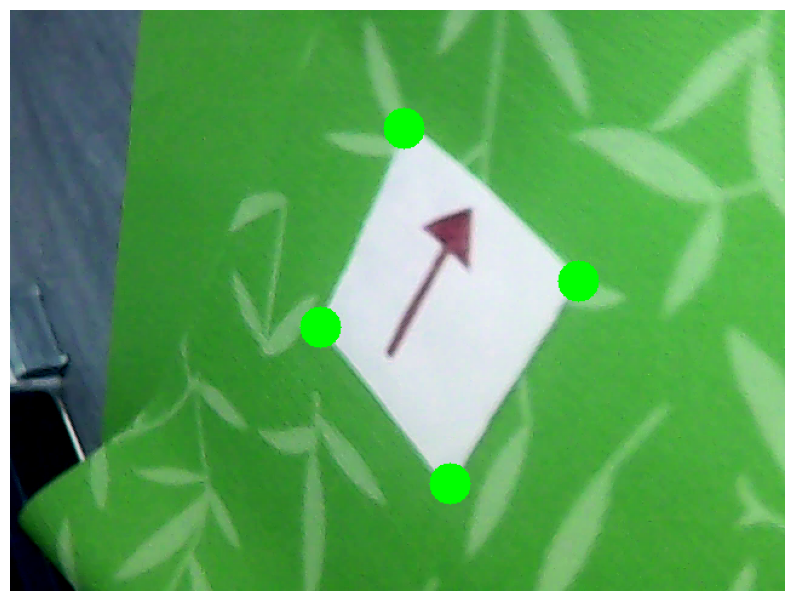

dist =  89.18315428344268


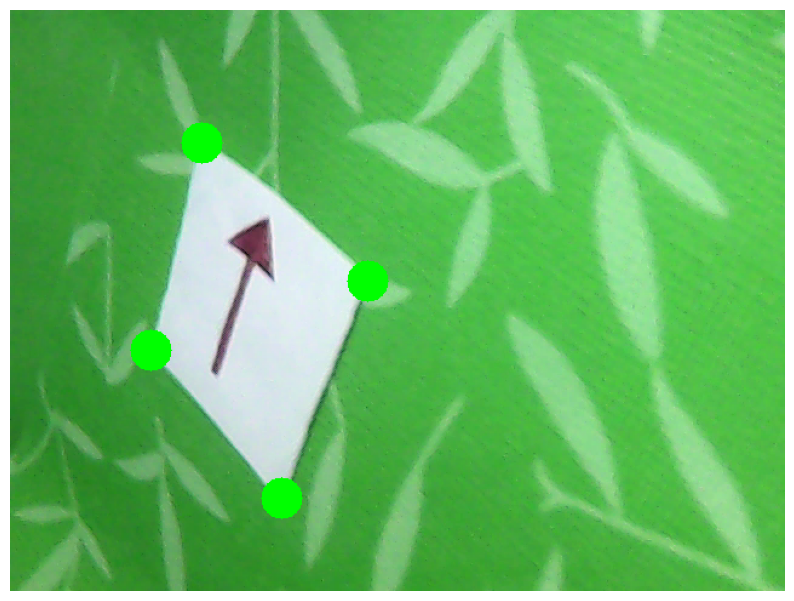

dist =  92.3061064289346


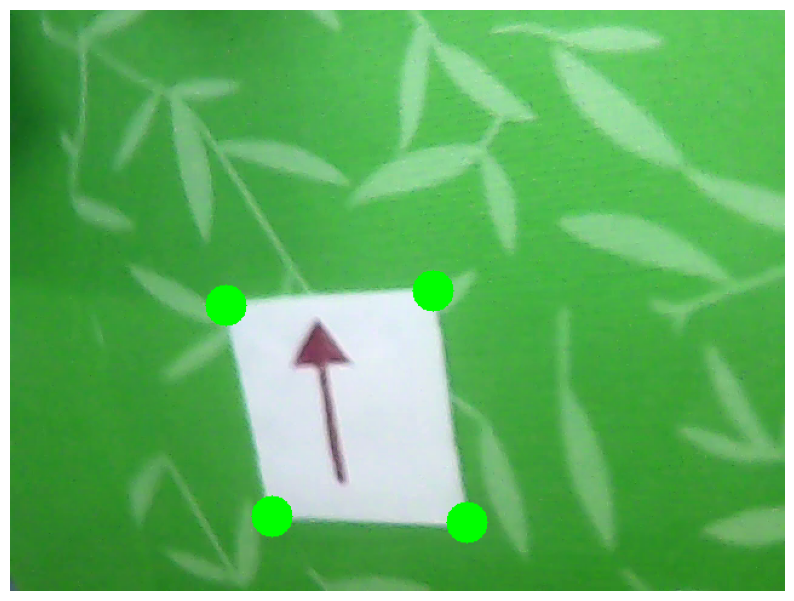

dist =  93.11570706519151


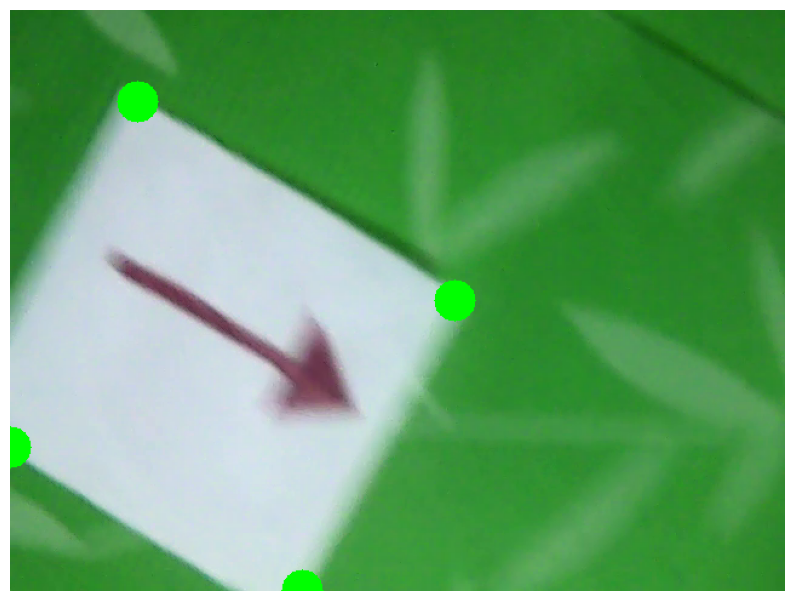

dist =  56.907636680245155


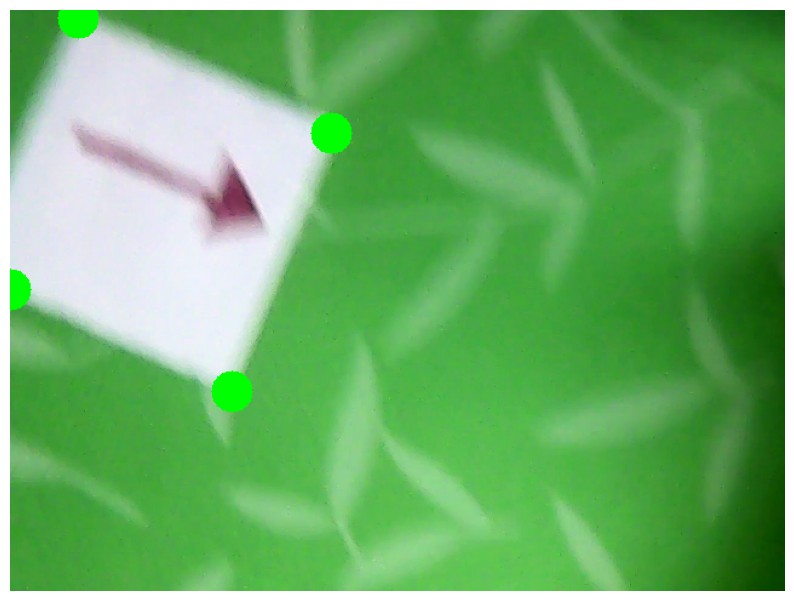

dist =  73.61230330022511


In [145]:

for frame in images:
    img = cv.imread(frame)

    dist = find_distance(img, lth, hth)
    print("dist = ", dist)

# 3rd task

In [146]:
def order_points(pts):
    rect = np.zeros((4, 2), dtype="float32")

    s = pts.sum(axis=1)

    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    pts_sort = [r for i, r in enumerate(pts) if i != np.argmin(s) and i != np.argmax(s)]

    diff = np.diff(pts, axis=1)

    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    missing_index = list({i for i in range(0, 4)} - {np.argmin(s), np.argmax(s), np.argmin(diff), np.argmax(diff)})
    if len(missing_index) != 0:
        missing_index = missing_index[0]

    if np.array_equal(rect[2], rect[3]):
        if pts[missing_index, 0] > rect[2, 0]:
            rect[2, 0] = pts[missing_index, 0]
            rect[2, 1] = pts[missing_index, 1]
        else:
            rect[3, 0] = pts[missing_index, 0]
            rect[3, 1] = pts[missing_index, 1]

    return rect

def four_point_transform(image, pts):
    rect = order_points(pts)

    (tl, tr, br, bl) = rect
    
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")

    M = cv.getPerspectiveTransform(rect, dst)
    warped = cv.warpPerspective(image, M, (maxWidth, maxHeight))

    return warped


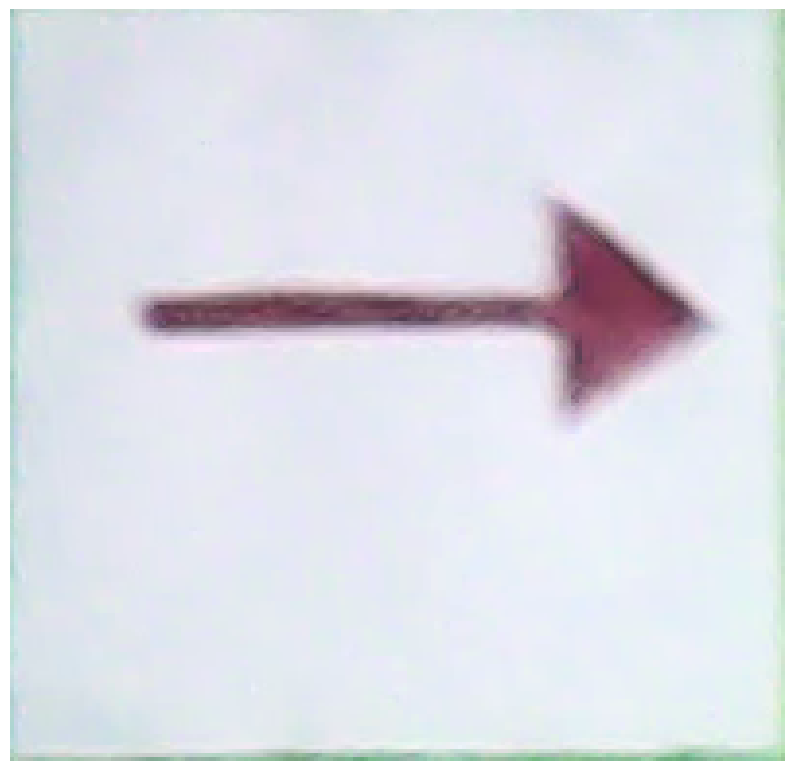

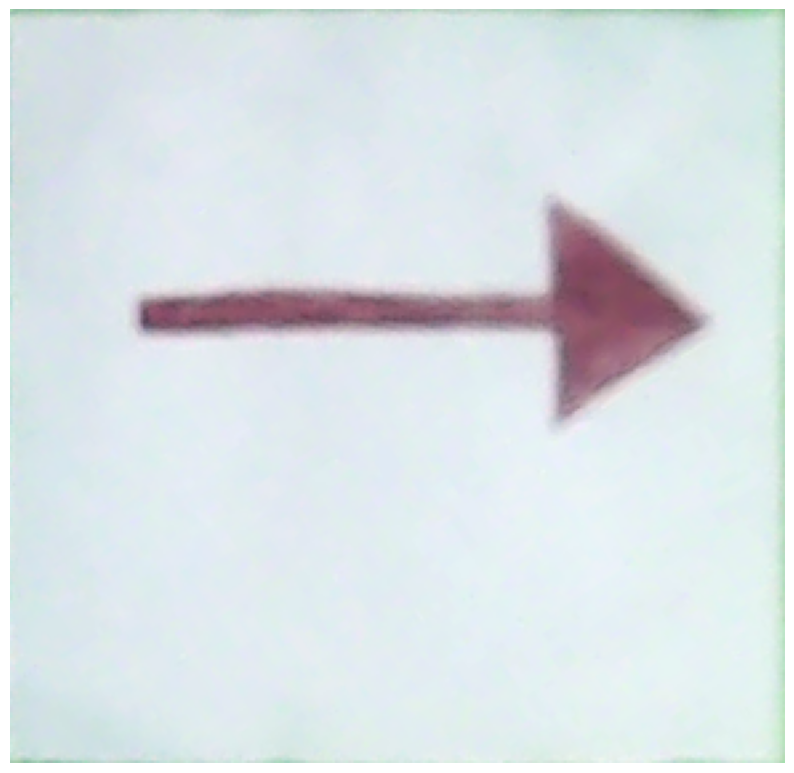

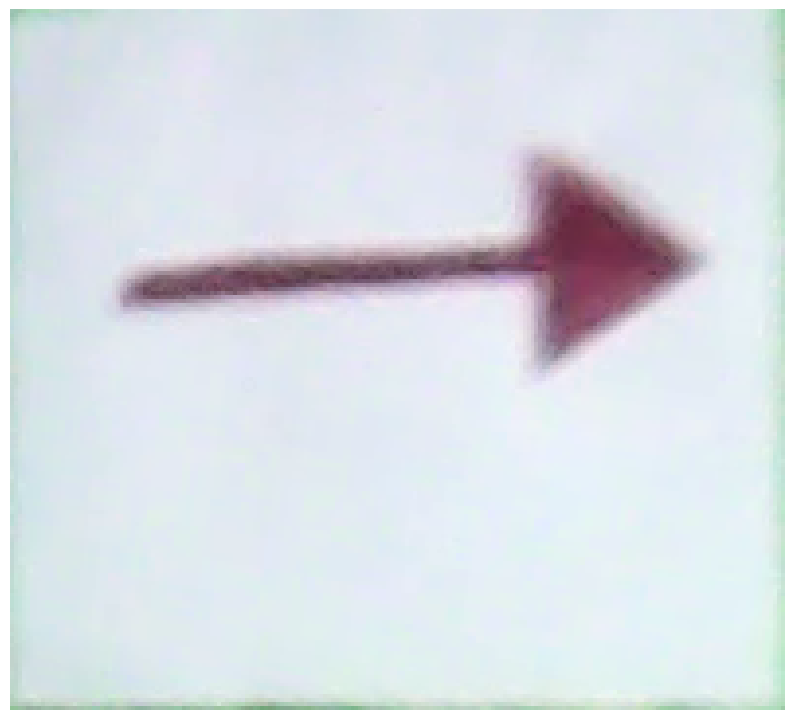

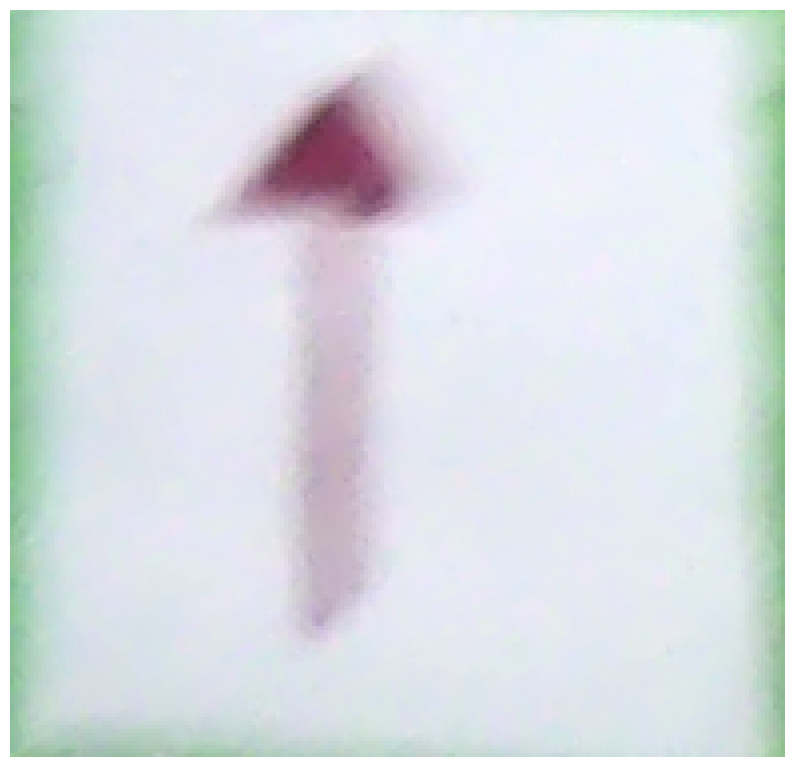

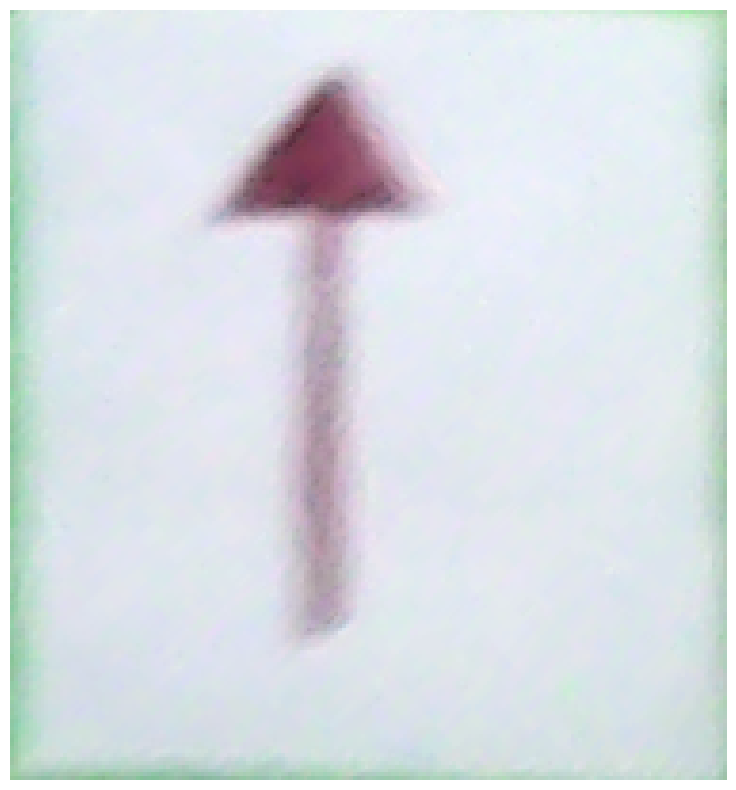

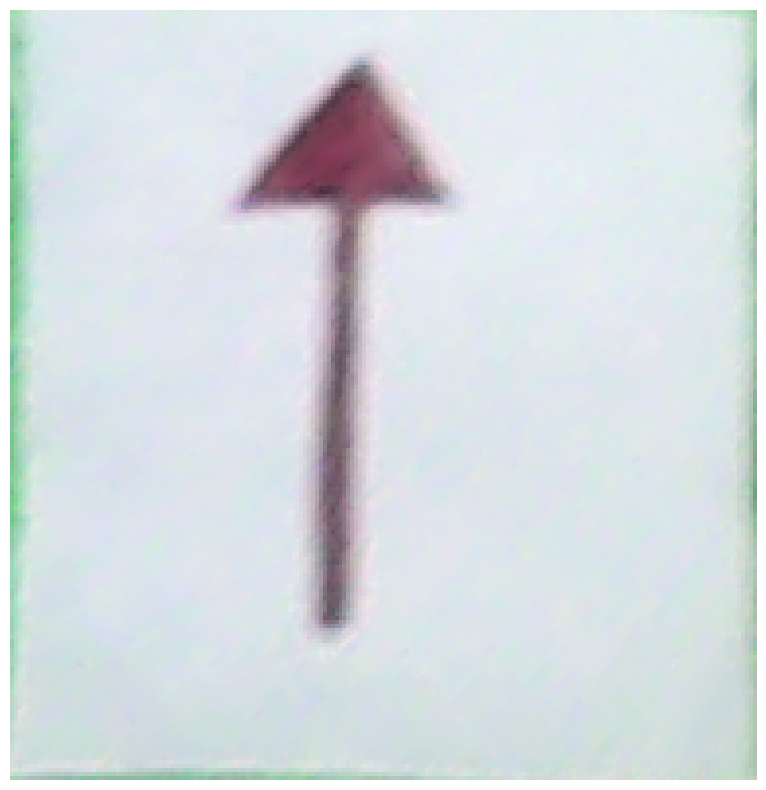

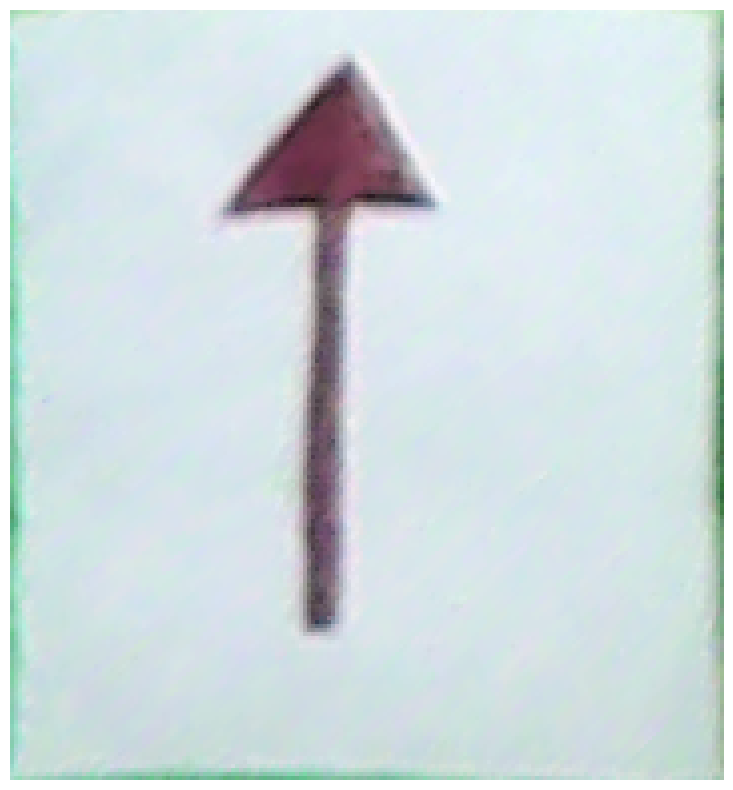

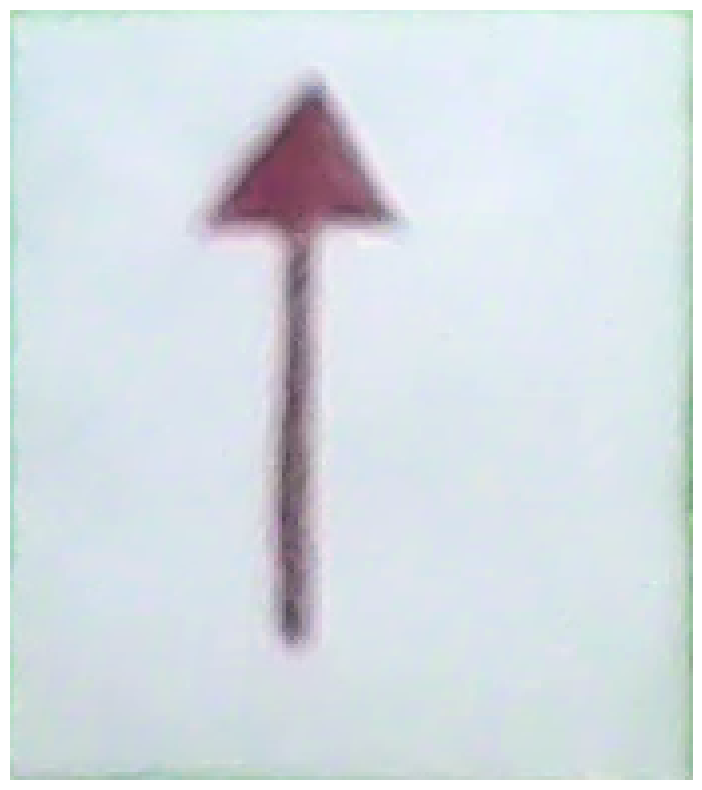

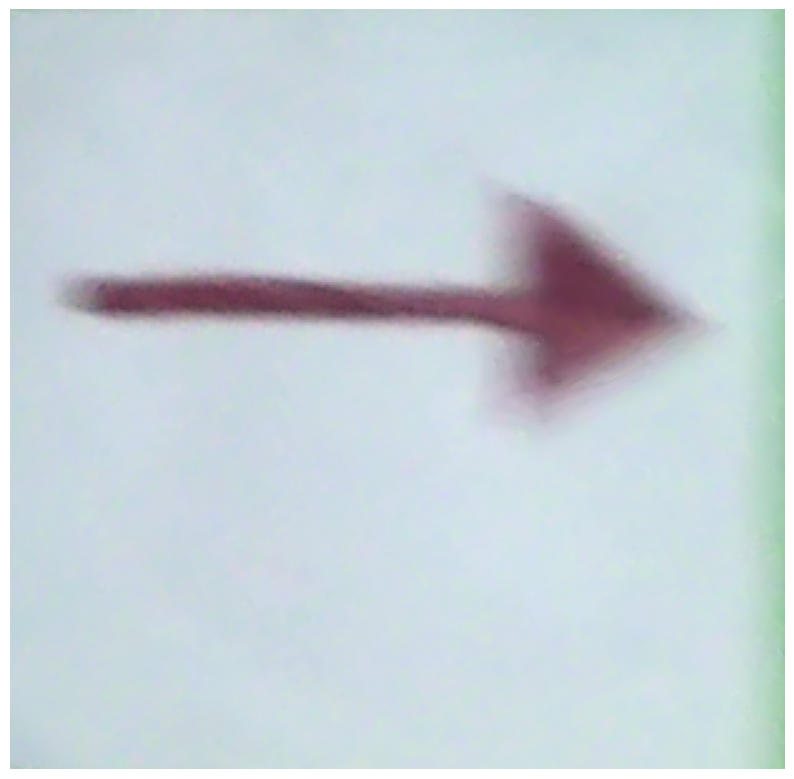

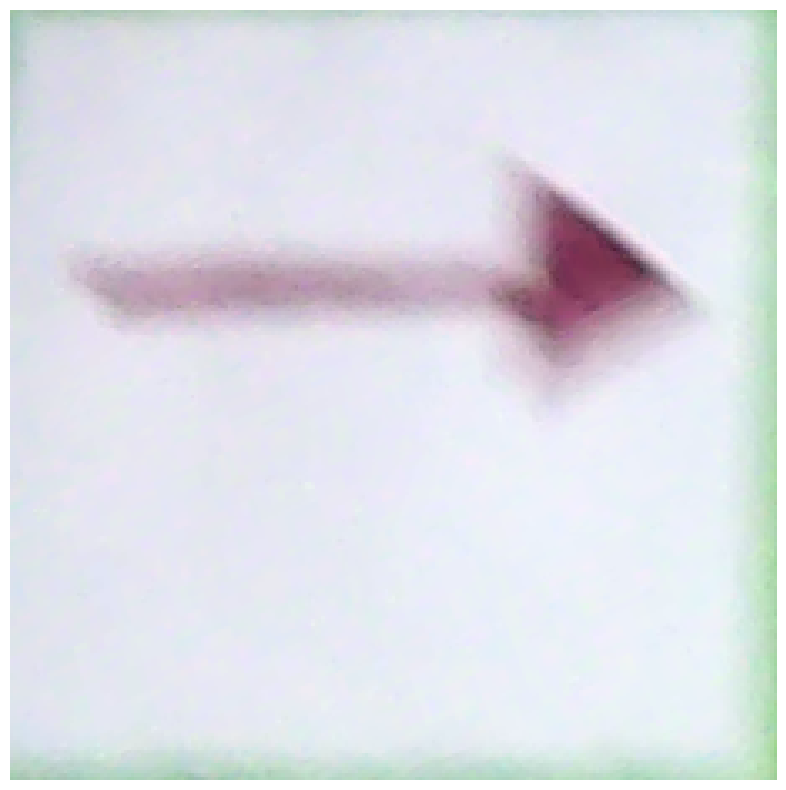

In [147]:

for frame in images:
    img = cv.imread(frame)

    approx = find_contour(img, lth, hth)
    warped = four_point_transform(img, np.asarray (approx) [:, 0, :])
    
    plt.imshow(warped)
    plt.axis('off')
    plt.show()

# 4th Task

In [148]:
lth2, hth2 = (111, 15, 56), (163, 156, 221)

In [149]:
def filter_cc(mask):
    connectivity = 4
    output = cv.connectedComponentsWithStats(mask, connectivity, cv.CV_32S)
    num_labels = output[0]
    labels = output[1]
    stats = output[2]

    if (num_labels < 1):
        return mask  

    max_area = 1
    max_label = 1     
    for i in range(1, num_labels):
        area = stats[i, cv.CC_STAT_AREA]
                
        if (area > max_area):
            max_area = area
            max_label = i
            
    for i in range(1, len(stats)):
        if (i != max_label):
            mask[np.where(labels == i)] = 0

    return mask




def skel_arrows(frame, lth, hth):
    frame_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

    frame_bin = cv.inRange(frame_hsv, lth, hth)
    frame_bin = filter_cc(frame_bin)
    frame_bin = cv.medianBlur(frame_bin, 5)

    skel = np.zeros((frame.shape[0], frame.shape[1]), np.uint8)
    size = np.size(frame_bin)

    element = cv.getStructuringElement(cv.MORPH_CROSS, (3,3))
    while True:
        open = cv.morphologyEx(frame_bin, cv.MORPH_OPEN, element)
        temp = cv.subtract(frame_bin, open)
        eroded = cv.erode(frame_bin, element)
        skel = cv.bitwise_or(skel, temp)
        frame_bin = eroded.copy()
        if cv.countNonZero(frame_bin)==0:
            break
   
    kernel = np.ones((1, 1), np.uint8)
    skel = cv.erode(skel, kernel)
    #skel = cv.dilate(skel, kernel + 4)
    return skel

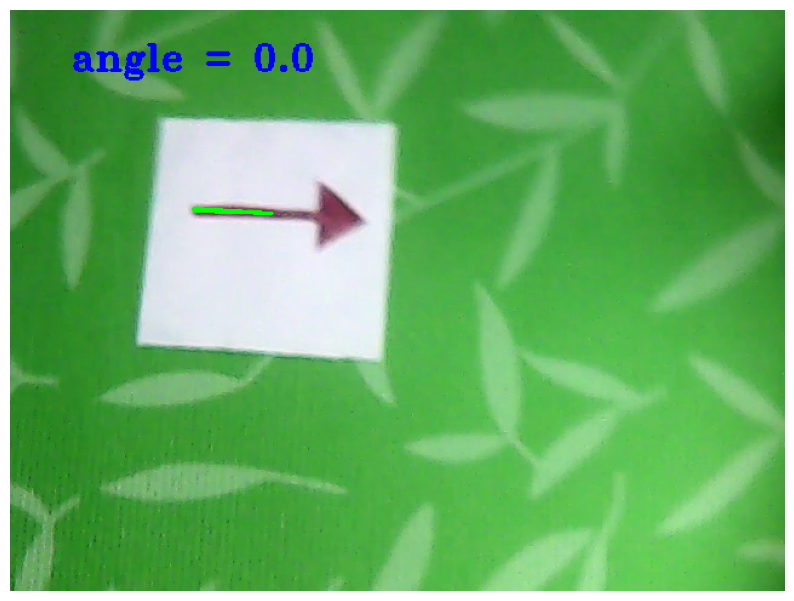

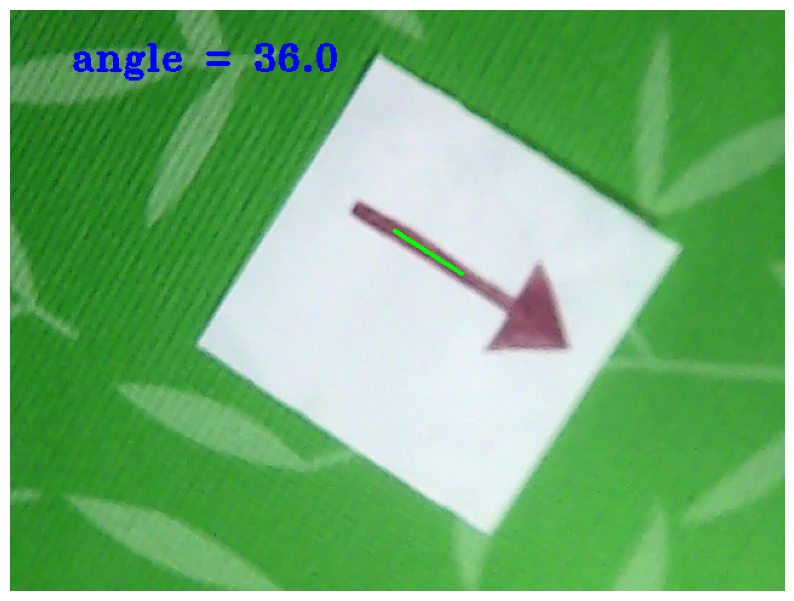

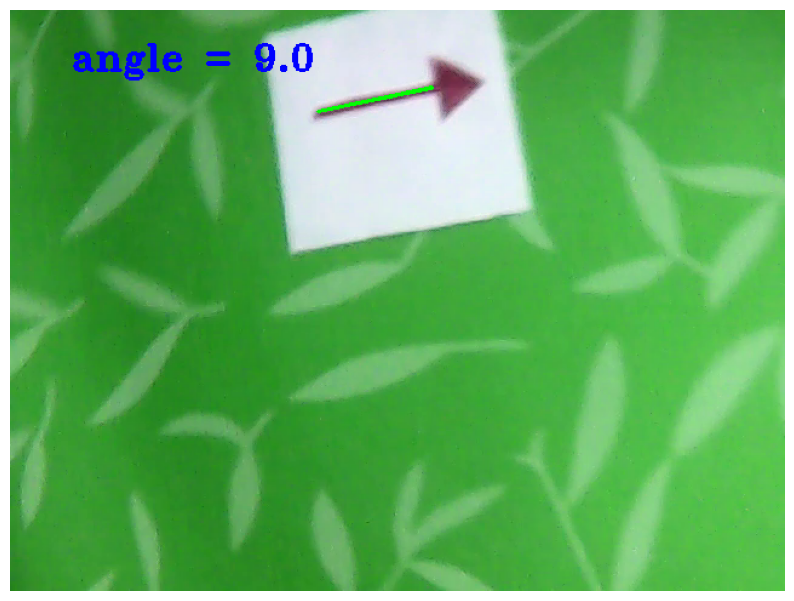

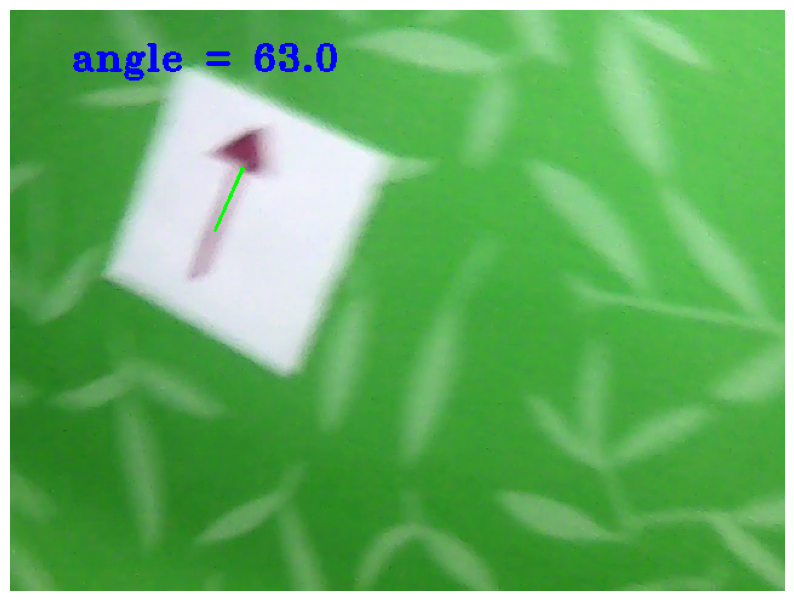

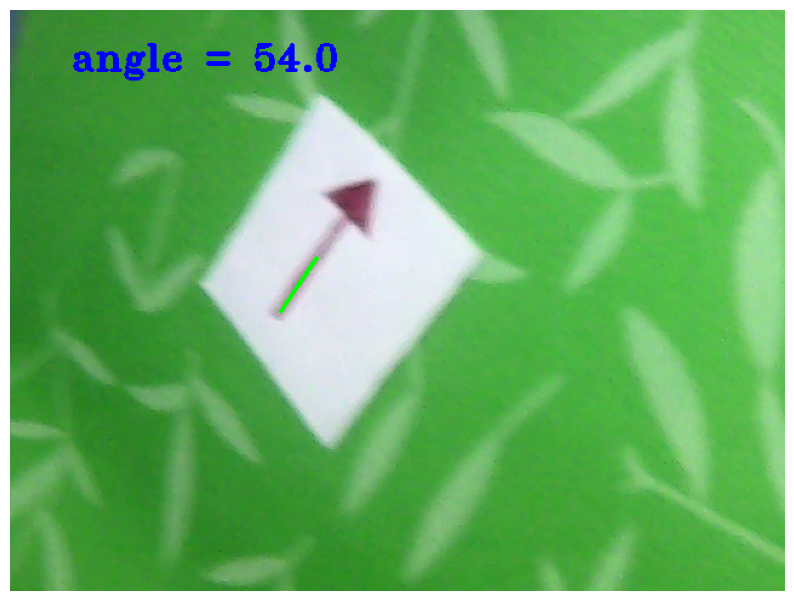

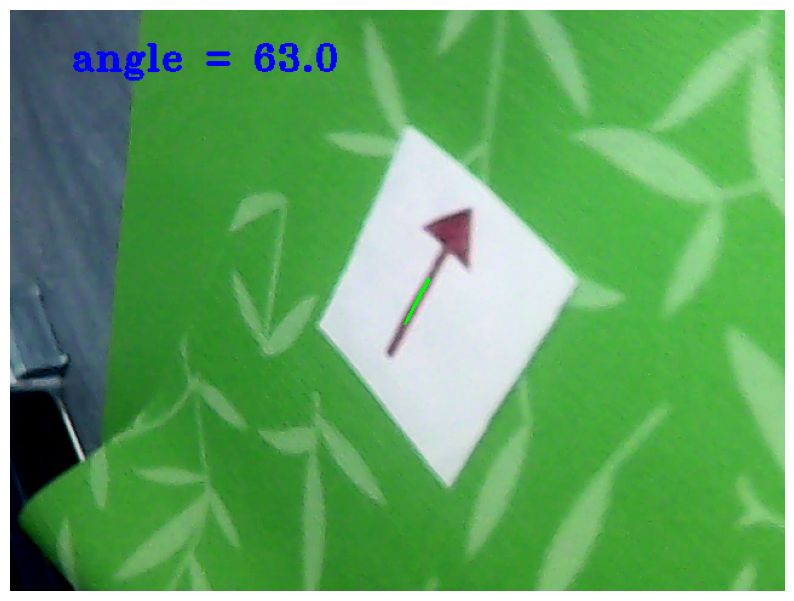

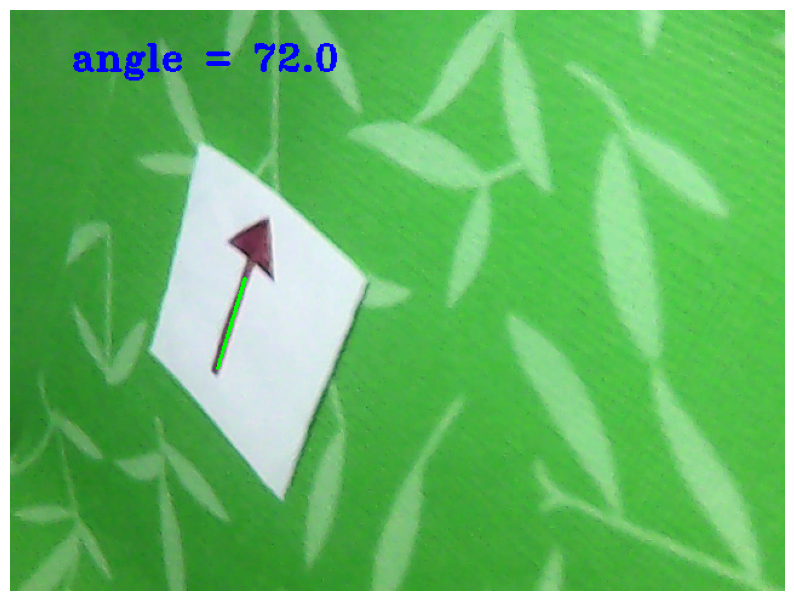

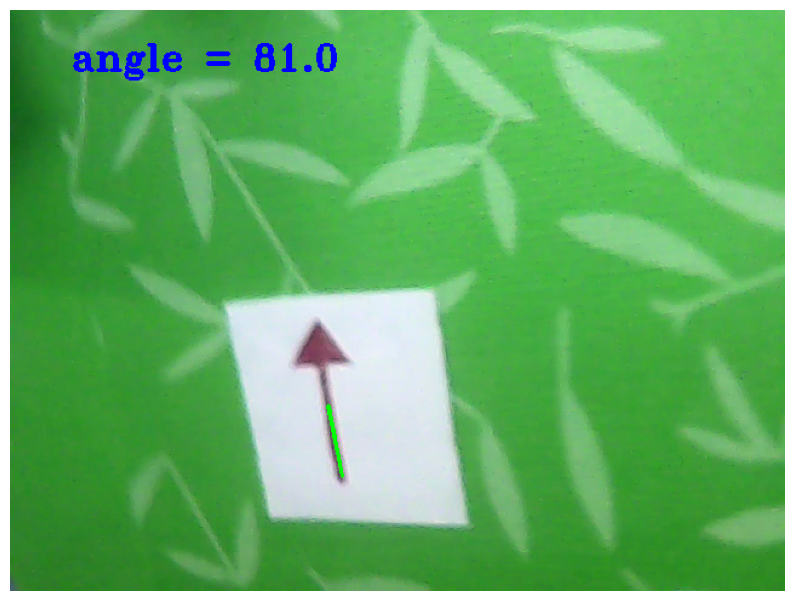

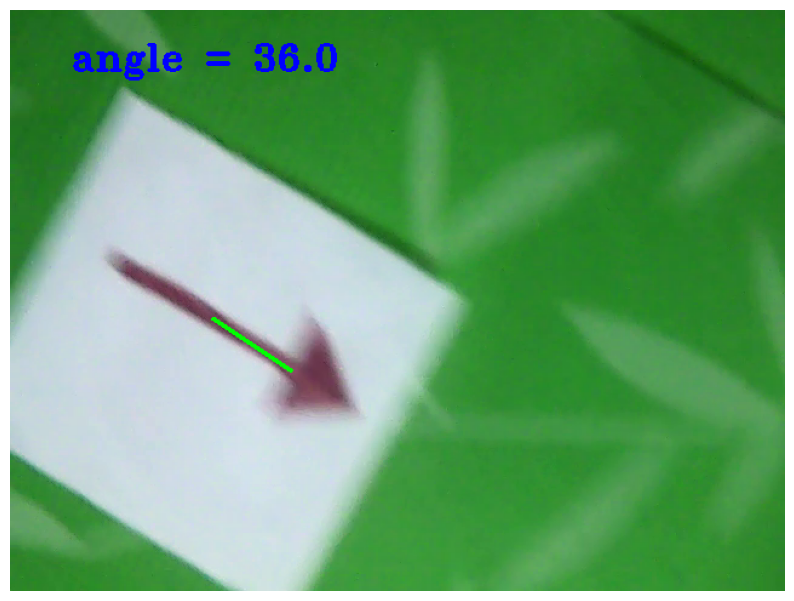

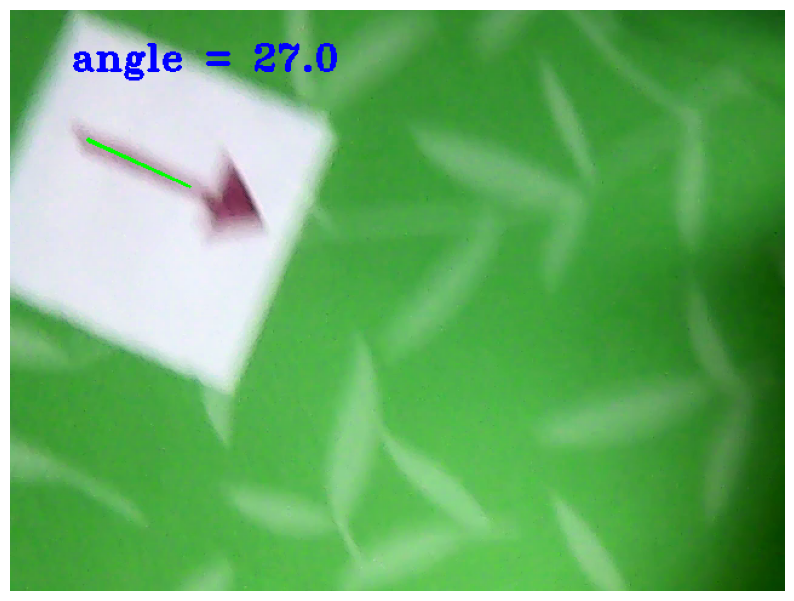

In [150]:
for frame in images:
    img = cv.imread(frame)

    skel = skel_arrows(img, lth2, hth2)

    contours, hierarchy = cv.findContours(skel, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cnt = max(contours, key=lambda x: cv.arcLength(x, False))

    length = cv.arcLength(cnt, False)
    approx = cv.approxPolyDP(cnt, 0.05 * length, False)

    blank_3ch = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)
    
    cv.drawContours(blank_3ch, [approx], -1, (255, 255, 255), 2)
    cv.drawContours(img, [approx], -1, (0, 255, 0), 2)
   
    blank = cv.cvtColor(blank_3ch, cv.COLOR_BGR2GRAY)
    lines = cv.HoughLines(blank,1,np.pi/20,43) 

    result = "angle = " + str(round(abs((lines[0, 0, 1] * 180 / np.pi) - 90), 3))  
    cv.putText(img, result, (50, 50), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0, 0, 255), 2)

    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [151]:
video_name = "../data/imgs/3.mov"

cam = cv.VideoCapture(video_name)

success, frame = cam.read()

while(True):
    success, frame = cam.read()

    if(success == False):
        cam.release()
        cam = cv.VideoCapture(video_name)
        continue

    img = np.copy(frame)

    skel = skel_arrows(img, lth2, hth2)

    contours, hierarchy = cv.findContours(skel, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cnt = max(contours, key=lambda x: cv.arcLength(x, False))

    length = cv.arcLength(cnt, False)
    approx = cv.approxPolyDP(cnt, 0.05 * length, False)

    blank_3ch = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)
    
    cv.drawContours(blank_3ch, [approx], -1, (255, 255, 255), 2)
    cv.drawContours(img, [approx], -1, (0, 255, 0), 2)
   
    blank = cv.cvtColor(blank_3ch, cv.COLOR_BGR2GRAY)
    lines = cv.HoughLines(blank,1,np.pi/20, 40) 

    if(lines is not None):
        result = "angle = " + str(round(abs((lines[0, 0, 1] * 180 / np.pi) - 90), 3))  
        cv.putText(img, result, (50, 50), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0, 0, 255), 2)

    cv.imshow("frame", img)

    key = cv.waitKey(200) & 0xFF

    if(key == ord('q')):
        break

cam.release()
cv.destroyAllWindows()
cv.waitKey(10)


-1

# Если делать через colab, то тогда так

In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=False)

In [ ]:
%cd

In [ ]:
%cd /content/drive/MyDrive

In [ ]:
video_name = "3.mov"

cam = cv.VideoCapture(video_name)

success, frame = cam.read()

while(True):
    success, frame = cam.read()

    if(success == False):
        break

    img = np.copy(frame)

    skel = skel_arrows(img, lth2, hth2)

    contours, hierarchy = cv.findContours(skel, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cnt = max(contours, key=lambda x: cv.arcLength(x, False))

    length = cv.arcLength(cnt, False)
    approx = cv.approxPolyDP(cnt, 0.05 * length, False)

    blank_3ch = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)
    
    cv.drawContours(blank_3ch, [approx], -1, (255, 255, 255), 2)
    cv.drawContours(img, [approx], -1, (0, 255, 0), 2)
   
    blank = cv.cvtColor(blank_3ch, cv.COLOR_BGR2GRAY)
    lines = cv.HoughLines(blank,1,np.pi/20, 40) 

    if(lines is not None):
        result = "angle = " + str(round(abs((lines[0, 0, 1] * 180 / np.pi) - 90), 3))  
        cv.putText(img, result, (50, 50), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0, 0, 255), 2)
        print(result)

    #cv.imshow("frame", img)

    #key = cv.waitKey(200) & 0xFF

    #if(key == ord('q')):
        #break

cam.release()
#cv.destroyAllWindows()
#cv.waitKey(10)